# **Crab Age Prediction**

La predicción de la edad de los cangrejos es una tarea fundamental en el estudio de la biología marina y la gestión sostenible de las poblaciones de estos crustáceos. La edad de los cangrejos proporciona información crucial sobre sus ciclos de vida, tasas de crecimiento y patrones de reproducción, aspectos esenciales para la conservación de sus hábitats y el manejo de la pesca comercial.

En este notebook, se aborda la predicción de la edad del cangrejo utilizando técnicas de aprendizaje automático. Se utiliza un conjunto de datos que incluye características morfológicas de los cangrejos, como la longitud de la concha, el ancho de la concha y el peso, entre otras. Estas características servirán como variables independientes en el modelo predictivo, mientras que la edad del cangrejo será la variable dependiente que intentaremos predecir.

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colors
import seaborn as sns
import os
import numpy as np
import warnings
import math


import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

from sklearn.preprocessing import MinMaxScaler, PolynomialFeatures, StandardScaler, OneHotEncoder
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

from mpl_toolkits.mplot3d import Axes3D
import plotly.express as px
import plotly.graph_objs as go
from plotly.offline import iplot
from plotly.subplots import make_subplots

# Selección del dataset

In [ ]:
df_crabs = pd.read_csv("crabs_prediction_large.csv", index_col = 0)

In [ ]:
print(f'Las columnas de los datos son: \n {df_crabs.columns}')

Las columnas de los datos son: 
 Index(['Sex', 'Length', 'Diameter', 'Height', 'Weight', 'Shucked Weight',
       'Viscera Weight', 'Shell Weight', 'Age'],
      dtype='object')


In [ ]:
# comprobamos el tamaño del dataset
df_crabs.shape

(74051, 9)

In [ ]:
df_crabs.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 74051 entries, 0 to 74050
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Sex             74051 non-null  object 
 1   Length          74051 non-null  float64
 2   Diameter        74051 non-null  float64
 3   Height          74051 non-null  float64
 4   Weight          74051 non-null  float64
 5   Shucked Weight  74051 non-null  float64
 6   Viscera Weight  74051 non-null  float64
 7   Shell Weight    74051 non-null  float64
 8   Age             74051 non-null  int64  
dtypes: float64(7), int64(1), object(1)
memory usage: 5.6+ MB


#2. Visualización y preprocesamiento de los datos

## Valores Nulos

In [ ]:
df_crabs.isna().sum()

Sex               0
Length            0
Diameter          0
Height            0
Weight            0
Shucked Weight    0
Viscera Weight    0
Shell Weight      0
Age               0
dtype: int64

No tenemos nan values, aunque algunos podrían haber sido añadidos con valor 0.

In [ ]:
df_crabs.describe(include= "all")

,Sex,Length,Diameter,Height,Weight,Shucked Weight,Viscera Weight,Shell Weight,Age
count,74051,74051.000000,74051.000000,74051.000000,74051.000000,74051.000000,74051.000000,74051.000000,74051.000000
unique,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,M,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,27084,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,1.317460,1.024496,0.348089,23.385217,10.104270,5.058386,6.723870,9.967806
std,NaN,0.287757,0.237396,0.092034,12.648153,5.618025,2.792729,3.584372,3.175189
min,NaN,0.187500,0.137500,0.000000,0.056699,0.028349,0.042524,0.042524,1.000000
25%,NaN,1.150000,0.887500,0.300000,13.437663,5.712424,2.863300,3.968930,8.000000
50%,NaN,1.375000,1.075000,0.362500,23.799405,9.908150,4.989512,6.931453,10.000000
75%,NaN,1.537500,1.200000,0.412500,32.162508,14.033003,6.988152,9.071840,11.000000


Los valores parecen habituales en general. Destaca quizás el valor máximo de stucked, viscera y shell weight. Observaremos su distribución para analizarlo. El valor mínimo de height es cuestionable y lo observamores con más detenimientos y también su valor máximo, que difiere mucho de Q3. Existen tres labels de Sex, pero lo veremos más adelante.

## Visualización de las variables

### Variables numéricas

In [ ]:
numeric_columns = df_crabs.select_dtypes(include=['float64', 'int64'])

Las variables presentan morfologías no normales por lo que procederemos a transformarlas para reducir los outliers y normalizarlas.

In [ ]:
# Transformación basados en el histograma para reducir outliers y normalizar

# Transformar las columnas 'Diameter' y 'Length' al cuadrado
df_crabs['Diameter'] = df_crabs['Diameter'] ** 2
df_crabs['Length'] = df_crabs['Length'] ** 2

# Transformar las columnas al tomar la raíz cuadrada
df_crabs['Shell Weight'] = np.sqrt(df_crabs['Shell Weight'])
df_crabs['Viscera Weight'] = np.sqrt(df_crabs['Viscera Weight'])
df_crabs['Shucked Weight'] = np.sqrt(df_crabs['Shucked Weight'])
df_crabs['Weight'] = np.sqrt(df_crabs['Weight'])

df_crabs['Age'] = np.log(df_crabs['Age'])

La variable height tiene dos outliers (heigth = 2.825 y 1.2875) que produce que el histograma no se muestre bien. Y como hemos visto en df.describe, es la única variable numérica con valores 0. Lo cual es erróneo. Procedemos a tratar dichas líneas.

In [ ]:
df_crabs[(df_crabs['Height'] > 1) | (df_crabs['Height'] == 0)]

,Sex,Length,Diameter,Height,Weight,Shucked Weight,Viscera Weight,Shell Weight,Age
id,,,,,,,,,
762,I,0.620156,0.330625,0.0000,1.930792,1.190578,0.898866,1.064885,1.386294
3585,I,0.543297,0.275625,0.0000,1.505975,0.858538,0.807489,0.841865,1.609438
4704,M,3.106406,1.995156,1.2875,7.915327,5.603309,3.411374,3.809848,2.484907
8749,I,0.275625,0.140625,0.0000,1.692129,1.097658,0.652106,0.652106,1.386294
9320,I,0.213906,0.105625,0.0000,0.944992,0.595289,0.376494,0.518961,1.945910
11542,I,0.406406,0.191406,0.0000,1.331106,0.798664,0.629994,0.680092,1.098612
13456,I,0.330625,0.160000,0.0000,1.141962,0.683935,0.583262,0.618642,1.098612
14406,I,0.543906,0.288906,0.0000,1.874923,1.276752,0.858538,0.937462,0.693147
15463,I,0.250000,0.160000,0.0000,1.148151,0.641146,0.476231,0.532442,1.386294


Debido a la complejidad de determinar cuál es la altura del cangrejo, imputamos la mediana de su respectivo género.

In [ ]:
filtro_altura = df_crabs[(df_crabs['Height'] == 0) | (df_crabs['Height'] > 1)]

# Paso 1: Calcula la mediana de la altura para cada grupo de sexo
medianas_altura = df_crabs.groupby('Sex')['Height'].median()

# Paso 2: Reemplaza las alturas de las filas que estén en filtro_altura con las medianas respectivas basadas en el sexo del cangrejo
for sexo, mediana_altura in medianas_altura.items():
    df_crabs.loc[df_crabs.index.isin(filtro_altura.index), 'Height'] = mediana_altura

### Variable categórica: Sex

In [ ]:
# outlier detection:
for i in numeric_columns.columns:
    fig=px.box(df_crabs, y=i, color="Sex", template="plotly_white", title=f"Boxplot of {i}")
    fig.update_layout(title= dict(text = f"Boxplot of {i}",
                                x = 0.5,
                                y = 0.95,
                                xanchor = 'center',
                                yanchor = 'top'),
                    xaxis = dict(title = i),
                    yaxis = dict(categoryorder='total ascending'),
                    font=dict(family ='Verdana',
                            size = 14),
                    template="plotly_white")
    fig.show()

In [ ]:
conteo_sex = df_crabs['Sex'].value_counts()

# Mostrar el conteo
print("conteo de tipos de sexo de los cangrejos:\n",conteo_sex)

conteo de tipos de sexo de los cangrejos:
 M    27084
I    23957
F    23010
Name: Sex, dtype: int64


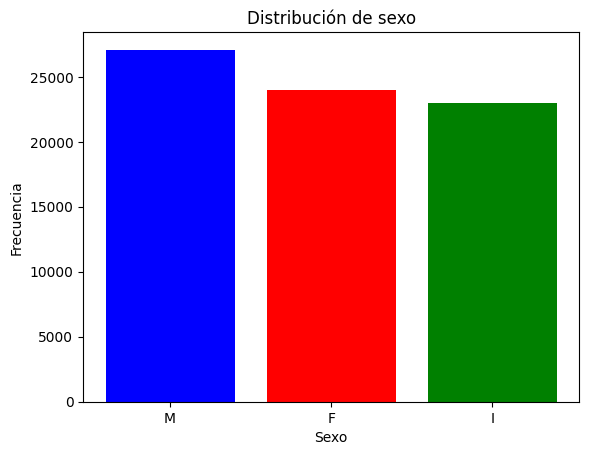

In [ ]:
# Datos
sexos = ['M', 'F', 'I']

# Creamos el gráfico de barras
plt.bar(sexos, conteo_sex, color=['blue', 'red', 'green'])

# Agregamos etiquetas y título
plt.xlabel('Sexo')
plt.ylabel('Frecuencia')
plt.title('Distribución de sexo')

plt.show()

La variable categórica está bastante equilibrada. Tenemos número parecido de cada label.

#### Conversión a variable numérica

In [ ]:
# Crear una instancia de OneHotEncoder con drop='first'
encoder = OneHotEncoder(drop='first', sparse_output=False)

# Ajustar y transformar los datos de la columna 'Sex' (asumiendo que es una serie de pandas)
# Antes de aplicar OneHotEncoder, asegúrate de que 'Sex' esté en formato de matriz bidimensional
sex_encoded = encoder.fit_transform(df_crabs['Sex'].values.reshape(-1, 1))

# Crear un DataFrame con las nuevas columnas codificadas
# Es importante obtener los nombres de las categorías después de haber ajustado el codificador
encoded_df = pd.DataFrame(sex_encoded, columns=encoder.get_feature_names_out(['Sex']))

# Concatenar los datos codificados al DataFrame original
df_crabs = pd.concat([df_crabs, encoded_df], axis=1)

# Eliminar la columna original 'Sex'
df_crabs.drop('Sex', axis=1, inplace=True)

In [ ]:
df_crabs.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 74051 entries, 0 to 74050
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Length          74051 non-null  float64
 1   Diameter        74051 non-null  float64
 2   Height          74051 non-null  float64
 3   Weight          74051 non-null  float64
 4   Shucked Weight  74051 non-null  float64
 5   Viscera Weight  74051 non-null  float64
 6   Shell Weight    74051 non-null  float64
 7   Age             74051 non-null  float64
 8   Sex_I           74051 non-null  float64
 9   Sex_M           74051 non-null  float64
dtypes: float64(10)
memory usage: 6.2 MB


## Tratamiento de Outliers

En este apartado, nos centraremos en tratar los valores outliers que identifiquemos. Para ello, seleccionaremos las columnas de aquellas variables que hemos identificado con outliers en los boxplot que hemos realizado anteriormente.

Una vez seleccionadas, calcularemos el rango intercuartílico para ver de manera cuantitativa cuáles son aquellos valores que se pasan, ya sea por encima o por debajo, de estos límites.

In [ ]:
# Calculamos los límites superior e inferior para cada variable por separado
outliers_por_variable = {}
for col in df_crabs:
    Q1 = df_crabs[col].quantile(0.25)
    Q3 = df_crabs[col].quantile(0.75)
    IQR = Q3 - Q1
    limite_inferior = Q1 - 1.5 * IQR
    limite_superior = Q3 + 1.5 * IQR
    outliers_por_variable[col] = df_crabs[(df_crabs[col] < limite_inferior) | (df_crabs[col] > limite_superior)][col]

# Contador de outliers por fila
outliers_por_fila = {}
for key, value in outliers_por_variable.items():
    for index in value.index:
        if index in outliers_por_fila:
            outliers_por_fila[index] += 1
        else:
            outliers_por_fila[index] = 1

# Filtramos las filas que tienen más de tres outliers en total
filas_con_mas_de_tres_outliers = df_crabs[df_crabs.index.isin([index for index, count in outliers_por_fila.items() if count > 3])]

# Mostramos las filas con más de tres outliers en total
print("Filas con más de tres outliers en total:\n")
filas_con_mas_de_tres_outliers

Filas con más de tres outliers en total:



,Length,Diameter,Height,Weight,Shucked Weight,Viscera Weight,Shell Weight,Age,Sex_I,Sex_M
1190,0.250000,0.056406,0.1375,0.714347,0.206214,0.206214,0.394870,1.098612,1.0,0.0
1403,0.140625,0.105625,0.0750,0.607078,0.505119,0.376494,0.412428,1.386294,1.0,0.0
1462,0.170156,0.075625,0.0875,0.641146,0.429269,0.291631,0.376494,1.386294,1.0,0.0
1474,0.160000,0.090000,0.0875,0.641146,0.394870,0.376494,0.376494,1.098612,1.0,0.0
1996,0.035156,0.018906,0.0625,0.238116,0.168373,0.273950,0.206214,1.386294,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...
72297,0.191406,0.090000,0.1000,0.641146,0.461109,0.429269,0.376494,1.386294,1.0,0.0
72453,0.170156,0.075625,0.0750,0.652106,0.394870,0.291631,0.376494,1.386294,1.0,0.0
72644,0.170156,0.068906,0.0875,0.641146,0.376494,0.314997,0.376494,1.386294,1.0,0.0
72952,0.170156,0.090000,0.0875,0.641146,0.376494,0.314997,0.376494,1.386294,1.0,0.0


In [ ]:
df_crabs.describe()

,Length,Diameter,Height,Weight,Shucked Weight,Viscera Weight,Shell Weight,Age,Sex_I,Sex_M
count,74051.000000,74051.000000,74051.000000,74051.000000,74051.000000,74051.000000,74051.000000,74051.000000,74051.000000,74051.000000
mean,1.818504,1.105948,0.348137,4.612641,3.025982,2.142110,2.477957,2.250850,0.323520,0.365748
std,0.696120,0.446046,0.090851,1.452167,0.973506,0.685388,0.763942,0.313814,0.467822,0.481643
min,0.035156,0.018906,0.012500,0.238116,0.168373,0.206214,0.206214,0.000000,0.000000,0.000000
25%,1.322500,0.787656,0.300000,3.665742,2.390068,1.692129,1.992217,2.079442,0.000000,0.000000
50%,1.890625,1.155625,0.362500,4.878463,3.147721,2.233722,2.632765,2.302585,0.000000,0.000000
75%,2.363906,1.440000,0.412500,5.671200,3.746065,2.643511,3.011950,2.397895,1.000000,1.000000
max,4.051422,2.600156,0.812500,8.949945,6.494925,4.641726,5.337719,3.367296,1.000000,1.000000


Las transformaciones han normalizado en mayor medida nuestros valores por lo que no vemos outliers en general. Podríamos destacar estos dos cangrejos. Las edad del 1330 es la mínimo por lo que nos parece lógico que tenga valores muy bajos. Por otro lado el 772 tiene una edad mayor pero no extrema. Su altura es la máxima por lo que probablemente sea un cangrejo grande en general. Por el momento los mantendremos a ambos si no nos repercuten posteriormente en el estudio.

## Estudio de la Correlación

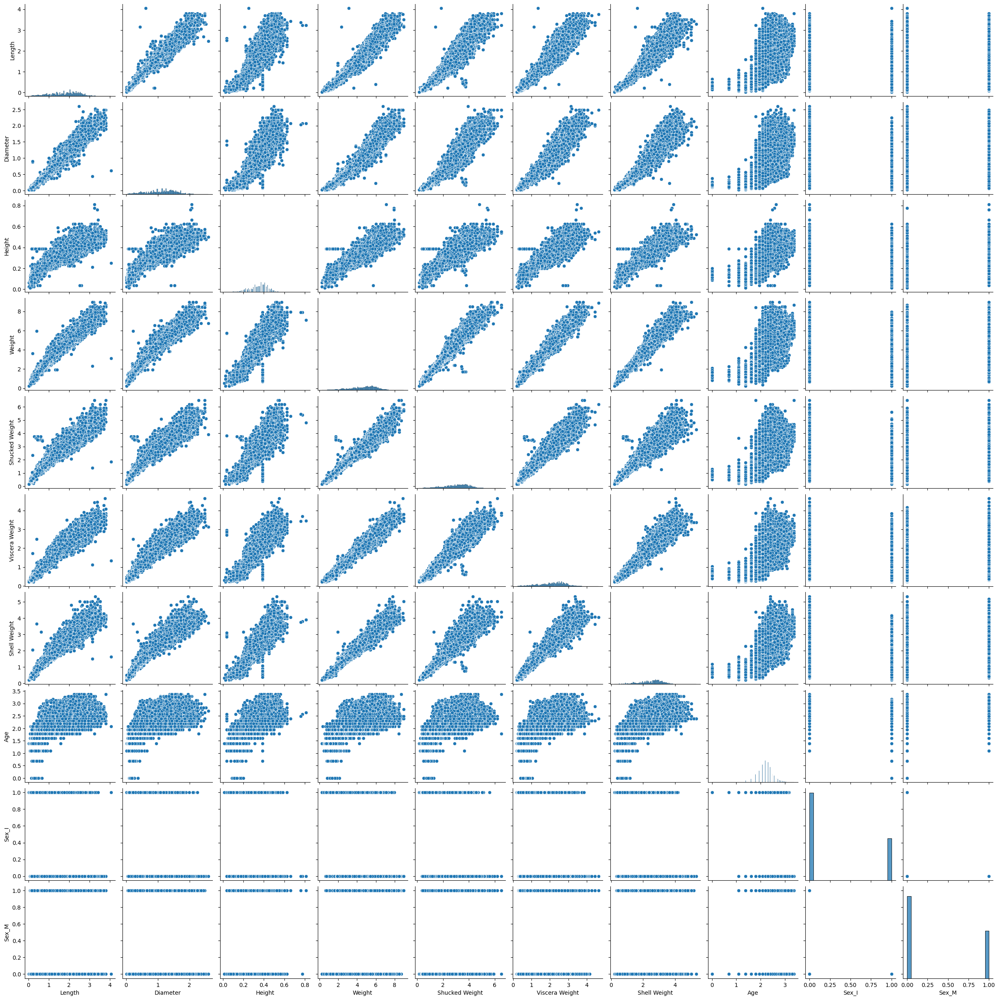

In [ ]:
sns.pairplot(df_crabs)
plt.show()

De esta vista general, podemos observar como existen correlaciones muy evidentes a simple vista. Por ejemplo, a simple vista vemos que la longitud o el diámetro estarían altamente relacionados entre los diferentes pesos (a mayor diámetro o longitud, mayor peso). De igual manera, parecería que a mayor edad los cangrejos serían más grandes o más pesados.

A continuación, analizaremos las correlaciones de manera que se pueda ver todo más detalladamente y eliminar las variables que explican la misma información.

In [ ]:
# División de las variables en variable objectivo (de estudio) y características
# Features
X = df_crabs.drop(columns = "Age")

# Variable objectivo
y = df_crabs["Age"]

Pasamos a analizar la matriz de correlaciones mediante un mapa de calor.

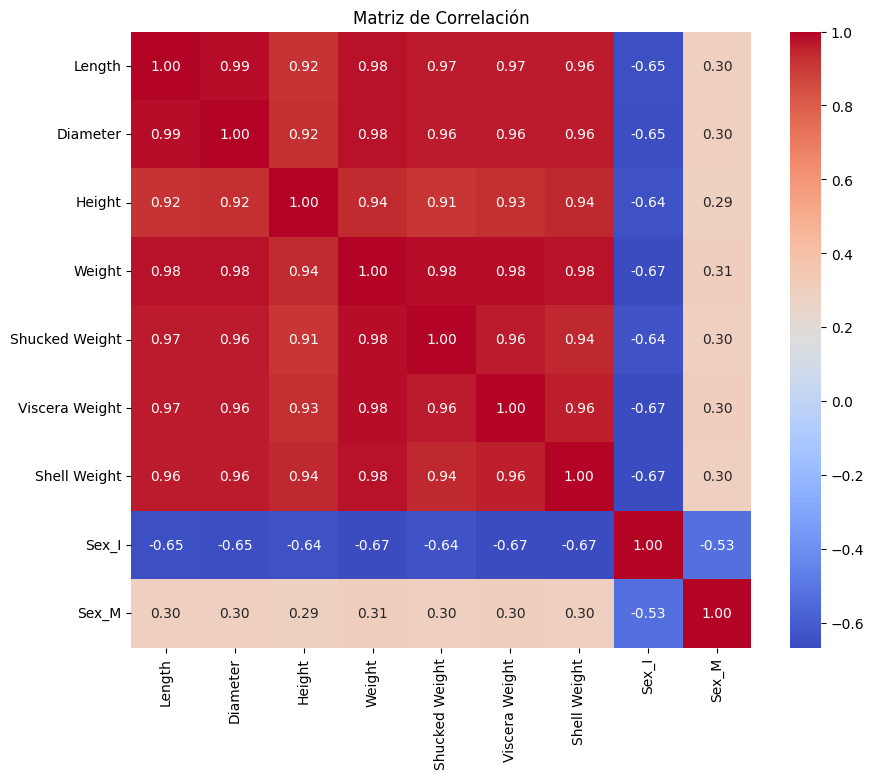

In [ ]:
matriz_correlacion = X.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(matriz_correlacion, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Matriz de Correlación')
plt.show()

De esta matriz de correlación podemos empezar a sacar las primeras conclusiones:

- En primer lugar, la alta correlación existente entre longitud y diámetro es evidente. Debido a la forma más bien circular del cangrejo, que sea más largo implica que el diámetro de su cuerpo aumenta prácticamente en la misma proporción.

- En términos similares, la altura del cangrejo parece tener que ver en gran medida con prácticamente todos los demás parámetros físicos del animal. Es decir, a medida que ésta aumenta, los demás parámetros también aumentan.

- En referencia al peso, y de manera evidente, la mayor correlación se detecta entre las distintas medidas de los pesos. Esto es un hecho lógico, ya que un mayor peso total implica un mayor peso en algunos (o todos) los demás pesos (de visceras, de caparazón...) y viceversa. Aunque también está correlacionado con la longitud y altura, no lo está a un nivel tan alto, seguramente por el hecho de que existan cangrejos más altos con menor peso, al contrario de lo que pudiera parecer.

- En términos de sexo, como hemos visto existen 3 sexos: masculino, femenino e intersexual. Aunque los sexos masculono y femenino no tengan grandes correlaciones entre las demás variables, sí que hemos detectado que los intersexuales parecen tener una correlación negativa (es decir, un comportamiento contrario) entre algunas variables, especialmente en términos de diámetro.

- Finalmente, y en referencia a nuestra variable objetivo, la edad parece estar altamente correlacionada con el peso del caparazón, incluso más que con el diámetro o la altura.

In [ ]:
# Agregar una columna de unos al conjunto de datos X
X_with_const = add_constant(X)

# Calcular el VIF para cada variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_with_const.columns
vif_data["VIF"] = [variance_inflation_factor(X_with_const.values, i) for i in range(X_with_const.shape[1])]

print(vif_data)

         Variable         VIF
0           const   47.166059
1          Length   44.517251
2        Diameter   42.002170
3          Height    9.611304
4          Weight  121.938372
5  Shucked Weight   33.307823
6  Viscera Weight   26.890936
7    Shell Weight   32.369760
8           Sex_I    2.312553
9           Sex_M    1.391592


In [ ]:
X.drop(columns = ["Weight", "Length"], inplace = True)
# Agregar una columna de unos al conjunto de datos X
X_with_const = add_constant(X)

# Calcular el VIF para cada variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_with_const.columns
vif_data["VIF"] = [variance_inflation_factor(X_with_const.values, i) for i in range(X_with_const.shape[1])]

print(vif_data)

         Variable        VIF
0           const  46.099520
1        Diameter  23.895887
2          Height   9.512854
3  Shucked Weight  17.438237
4  Viscera Weight  21.285834
5    Shell Weight  21.201667
6           Sex_I   2.304697
7           Sex_M   1.391424


In [ ]:
X.drop(columns = ["Viscera Weight", "Diameter"], inplace = True)

# Agregar una columna de unos al conjunto de datos X
X_with_const = add_constant(X)

# Calcular el VIF para cada variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_with_const.columns
vif_data["VIF"] = [variance_inflation_factor(X_with_const.values, i) for i in range(X_with_const.shape[1])]

print(vif_data)

         Variable        VIF
0           const  35.605398
1          Height   9.295084
2  Shucked Weight   9.533073
3    Shell Weight  14.737820
4           Sex_I   2.272858
5           Sex_M   1.389673


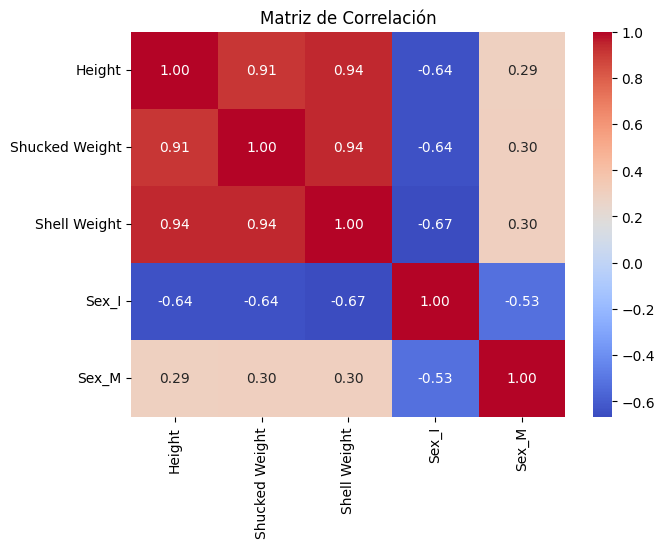

In [ ]:
matriz_correlacion = X.corr()
plt.figure(figsize=(7, 5))
sns.heatmap(matriz_correlacion, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Matriz de Correlación')
plt.show()

# Modelo: Regresión

En este apartado, procederemos a desarrollar nuestro modelo de predicción, el cual se engloba en la parte de ML supervisado. En concreto, la variable objetivo a pronosticar será la de la Edad del cangrejo (variable "Age" en nuestro dataset).

A continuación, desarrollaremos el modelo de regresión siguiendo estos pasos:

- Dividiremos las variables predictoras respecto la variable objetivo

- Separaremos nuestros datos entre el conjunto de entrenamiento (80%) y prueba (20%) mediante el uso del método "train_test_split"

- Definiremos el método de regresión y lo construiremos con el conjunto de entrenamiento. Después haremos la predicción con los datos de test para poder evaluarlo.

- Una vez hecha la predicción, sacaremos las métricas más comunes (MSE, MAE y R cuadrado) de nuestro modelo.

- Trataremos de realizar el mismo ejercicio mediante la construcción del modelo de regresión polinómica. Esto se debe a la identificación de alguna relación entre variables que sigue una tendencia no lineal y más bien curvilínea (véase el gráfico de correlaciones entre los diferentes pesos y el diámetro y longitud).

- Finalmente, haremos uso de la validación cruzada para evaluar nuestro modelo de regresión lineal. Es decir, podremos ver qué tan bueno es nuestro modelo generalizando a datos no vistos. También exploraremos las posibles mejoras en nuestro modelo y descartando que no tenga menor rendimiento debido a un sobreajuste.

In [ ]:
# Separamos los datos en conjuntos de entrenamiento y prueba (80% entrenamiento, 20% prueba)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
from sklearn.model_selection import cross_val_score

# Definir la pipeline
pipeline_regresion = Pipeline([
    ('regression', LinearRegression())  # Modelo de regresión lineal
])

# Calcular las puntuaciones de validación cruzada
cv_scores = cross_val_score(pipeline_regresion, X_train, y_train, cv=5, scoring='neg_mean_squared_error')

# Convertir las puntuaciones de error a positivas y calcular la media
mse_cv = -cv_scores.mean()

# Entrenar la pipeline con el conjunto de entrenamiento completo
pipeline_regresion.fit(X_train, y_train)

# Evaluamos el modelo con el conjunto de testeo
y_pred = pipeline_regresion.predict(X_test)

# Calculamos el error absoluto medio (MAE)
mae = mean_absolute_error(y_test, y_pred)

# Calculamos el coeficiente de determinación R^2
r2 = r2_score(y_test, y_pred)

print("Métricas del modelo de regresión lineal con validación cruzada (cv=5):")
print("Error cuadrático medio (MSE) en validación cruzada:", mse_cv)
print("Error absoluto medio (MAE) en conjunto de prueba:", mae)
print("Coeficiente de determinación R^2 en conjunto de prueba:", r2)

Métricas del modelo de regresión lineal con validación cruzada (cv=5):
Error cuadrático medio (MSE) en validación cruzada: 0.03628201146820679
Error absoluto medio (MAE) en conjunto de prueba: 0.14310420679438046
Coeficiente de determinación R^2 en conjunto de prueba: 0.6314304069999188


In [ ]:
from sklearn.model_selection import GridSearchCV

# Definimos los grados polinomiales que queremos probar
grados_polinomiales = [1, 2, 3, 4, 5, 6]

# Creamos la pipeline
pipeline_polynomial = Pipeline([
    ('polynomialfeatures', PolynomialFeatures()),  # Transformación polinomial
    ('regression', LinearRegression())  # Modelo de regresión lineal
])

# Definimos los parámetros para la búsqueda de hiperparámetros
parametros = {
    'polynomialfeatures__degree': grados_polinomiales  # Grado del polinomio
}

# Realizamos la búsqueda de hiperparámetros utilizando GridSearchCV
grid_search = GridSearchCV(pipeline_polynomial, parametros, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

# Obtenemos el mejor modelo
mejor_modelo = grid_search.best_estimator_

# Realizamos predicciones sobre el conjunto de prueba
predicciones_polynomial = mejor_modelo.predict(X_test)

# Calculamos las métricas de evaluación del mejor modelo
mse_polynomial = mean_squared_error(y_test, predicciones_polynomial)
mae_polynomial = mean_absolute_error(y_test, predicciones_polynomial)
r2_polynomial = r2_score(y_test, predicciones_polynomial)

print("Métricas del mejor modelo de regresión polinomial múltiple:")
print("Error cuadrático medio (MSE):", mse_polynomial)
print("Error absoluto medio (MAE):", mae_polynomial)
print("Coeficiente de determinación R^2:", r2_polynomial)
print("Mejor grado polinomial:", mejor_modelo.named_steps['polynomialfeatures'].degree)

Métricas del mejor modelo de regresión polinomial múltiple:
Error cuadrático medio (MSE): 0.033308646181349016
Error absoluto medio (MAE): 0.1354785915052127
Coeficiente de determinación R^2: 0.6688993568704719
Mejor grado polinomial: 4


Basándonos en estos resultados, podemos inferir las siguientes conclusiones:

- Después de haber evaludado el modelo mediante la validación cruzada separando los datos en 5 divisiones, todo parece indicar que el modelo de regresión polinómica tendría un mejor rendimiento a la hora de pronosticar la edad del cangrejo (R^2: 0.669), respecto el modelo de regresión simple (R^2: 0.631).

- El modelo de regresión polinómica de grado 4 es el que mejores resultados da.

- Hemos comprobado (aunque no se vea) la estandarización. Sin embargo, debido a las transformaciones realizadas, ya no es necesaria, ya que conseguimos la misma R^2. Al incorporar estas transformaciones (raíz cuadrada o potencia al cuadrado), normalizamos los datos y mejoramos la R^2 en comparación con solo estandarizar.


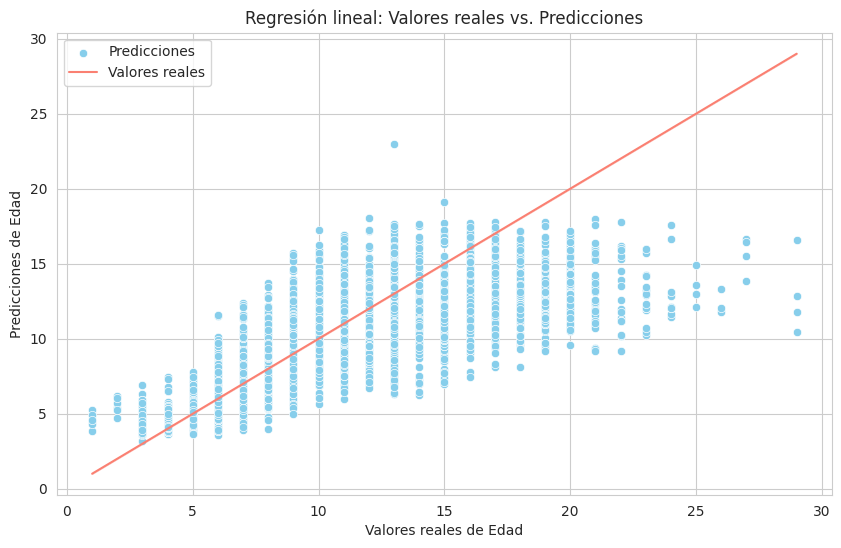

In [ ]:
#para verlo gráficamente

sns.set_style("whitegrid")
plt.figure(figsize=(10, 6))

sns.scatterplot(x=np.exp(y_test), y=np.exp(predicciones_polynomial), color='skyblue', label='Predicciones', marker='o')
sns.lineplot(x=np.exp(y_test), y=np.exp(y_test), color='salmon', label='Valores reales')

plt.xlabel('Valores reales de Edad')
plt.ylabel('Predicciones de Edad')
plt.title('Regresión lineal: Valores reales vs. Predicciones')

plt.legend()
plt.show()

A continuación veremos, si hubiera alguna manera de mejorar el modelo de predicción. Veremos dos opciones:

1. Diferencia en las métricas del conjunto de entrenamiento vs prueba. Si el rendimiento cambia y es significativamente mejor en el de entrenamiento, podría haber sobreajuste.

2. Análisis de los residuos. Los residuos son las diferencias entre los valores reales y los predichos. Este analisis nos sirve para identificar patrones o tendencias en el conjunto de prueba.


In [ ]:
# Calculamos las predicciones en los conjuntos de entrenamiento y prueba
predicciones_entrenamiento = mejor_modelo.predict(X_train)
predicciones_prueba = mejor_modelo.predict(X_test)

# Calculamos las métricas de rendimiento en los conjuntos de entrenamiento y prueba
mse_entrenamiento = mean_squared_error(y_train, predicciones_entrenamiento)
mse_prueba = mean_squared_error(y_test, predicciones_prueba)

r2_entrenamiento = r2_score(y_train, predicciones_entrenamiento)
r2_prueba = r2_score(y_test, predicciones_prueba)

print("Métricas de rendimiento del modelo en el conjunto de entrenamiento:")
print("Error cuadrático medio (MSE):", mse_entrenamiento)
print("Coeficiente de determinación R^2:", r2_entrenamiento)
print("\nMétricas de rendimiento del modelo en el conjunto de prueba:")
print("Error cuadrático medio (MSE):", mse_prueba)
print("Coeficiente de determinación R^2:", r2_prueba)

Métricas de rendimiento del modelo en el conjunto de entrenamiento:
Error cuadrático medio (MSE): 0.032665260905372986
Coeficiente de determinación R^2: 0.6664991392206261

Métricas de rendimiento del modelo en el conjunto de prueba:
Error cuadrático medio (MSE): 0.033308646181349016
Coeficiente de determinación R^2: 0.6688993568704719


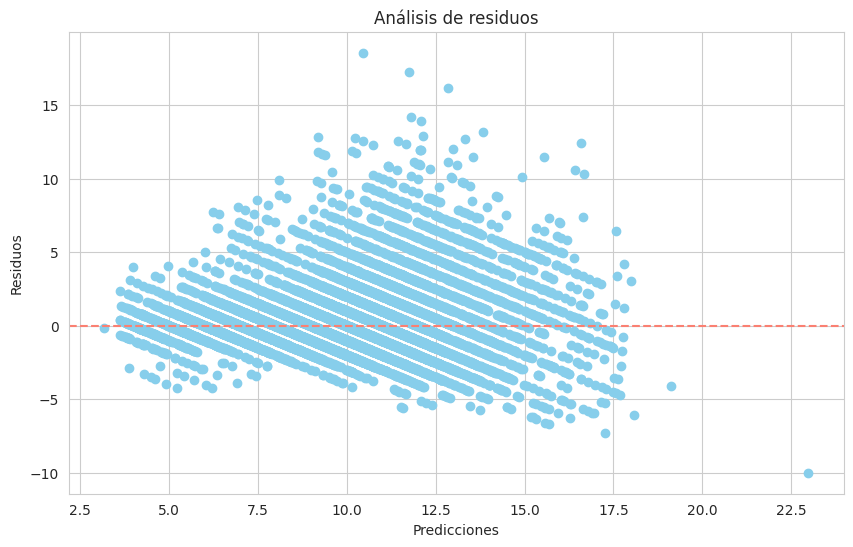

In [ ]:
# Calculamos los residuos
residuos = np.exp(y_test) - np.exp(predicciones_prueba)

# Graficamos los residuos
plt.figure(figsize=(10, 6))
plt.scatter(np.exp(predicciones_prueba), residuos, color='skyblue')
plt.axhline(y=0, color='salmon', linestyle='--')
plt.title('Análisis de residuos')
plt.xlabel('Predicciones')
plt.ylabel('Residuos')
plt.show()

Después de haber hecho este análisis, podemos concluir que nuestro modelo no tiene sobreajuste ya que:

1. El rendimiento del modelo en el conjunto de prueba y de testeo es prácticamente el mismo

2. En el gráfico de residuos vs predicciones, podemos ver que la línea horizontal del gráfico en cero (línea punteada) es el punto en el que los residuos son cero. En nuestro caso, parecer ser que los residuos están distribuidos aleatoriamente alrededor de esta línea y no muestran patrones sistemáticos, lo cual indica que el modelo está capturando bien la variabilidad en los datos.

# Clustering

En este apartado aplicaremos la técnica de aprendizaje no supervisado de clustering. El objetivo es determinar una clasificación de los cangrejos según sus características.

In [ ]:
df_crabs.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 74051 entries, 0 to 74050
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Length          74051 non-null  float64
 1   Diameter        74051 non-null  float64
 2   Height          74051 non-null  float64
 3   Weight          74051 non-null  float64
 4   Shucked Weight  74051 non-null  float64
 5   Viscera Weight  74051 non-null  float64
 6   Shell Weight    74051 non-null  float64
 7   Age             74051 non-null  float64
 8   Sex_I           74051 non-null  float64
 9   Sex_M           74051 non-null  float64
dtypes: float64(10)
memory usage: 6.2 MB


Para llevar a cabo la clasificación de los cangrejos, usaremos el alogaritmo de K-Means.

Seguiremos los siguientes pasos:

1.   Probaremos K-Means con un número aleatorio y graficaremos como se agrupan los valores según dos variables dadas.
2. Aplicaremos el método Elbow para identificar el número óptimo de clústers y reharemos el algoritmo de KMeans utilizando este número óptimo.
3. Aplicaremos PCA, para la reducción de dimensionalidad y definiremos el número de componentes principales de manera gráfica.



/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



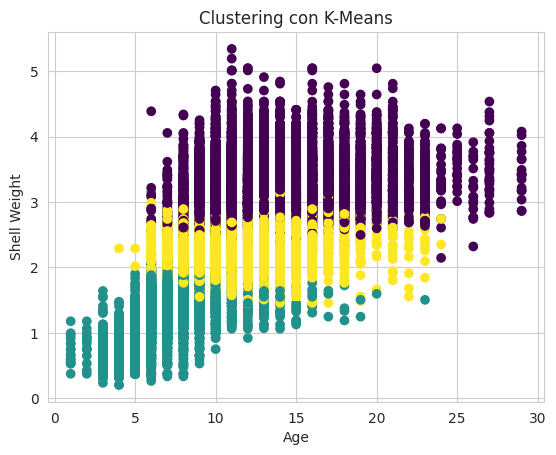

In [ ]:
# Empezamos estandarizando los datos
scaler = StandardScaler()
scaled_features = scaler.fit_transform(df_crabs)

# Aplicamos K-Means con 3
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(scaled_features)
labels = kmeans.labels_

# Eligimos la edad y el peso de la concha para ver las agrupaciones de manera gráfica
plt.scatter(df_crabs['Age'].apply(lambda x: math.exp(x)), df_crabs['Shell Weight'], c=labels, cmap='viridis')
plt.xlabel('Age')
plt.ylabel('Shell Weight')
plt.title('Clustering con K-Means')
plt.show()

Vemos que agrupando los datos según  clústers diferentes, podemos explicar mucho según el peso de la concha y bastante según la edad.

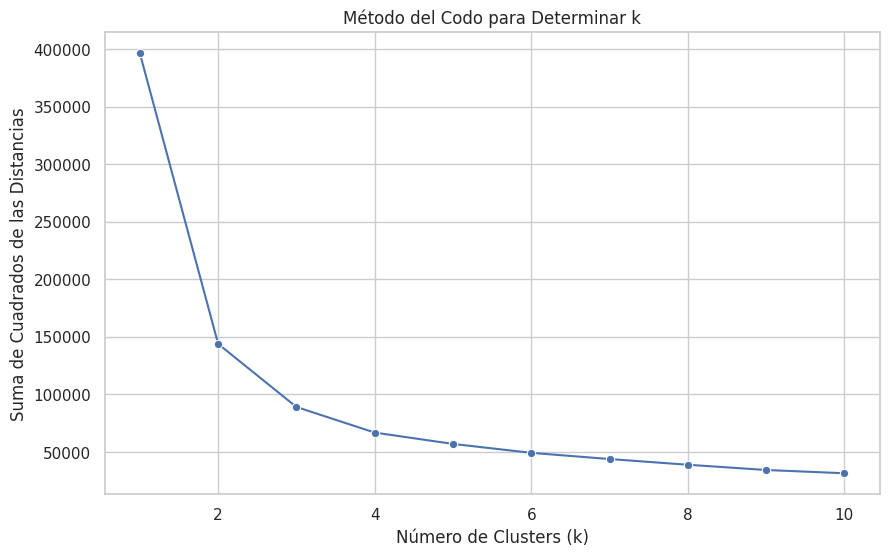

In [ ]:
warnings.filterwarnings("ignore", category=FutureWarning)

# Calculamos la suma de los cuadrados de las distancias para diferentes valores de k
sum_of_squared_distances = []
K_range = range(1, 11)  # Probamos con k desde 1 hasta 10 clusters

for k in K_range:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(df_crabs)
    sum_of_squared_distances.append(kmeans.inertia_)


sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
sns.lineplot(x=K_range, y=sum_of_squared_distances, marker='o')
plt.xlabel('Número de Clusters (k)')
plt.ylabel('Suma de Cuadrados de las Distancias')
plt.title('Método del Codo para Determinar k')
plt.show()

Según el método del codo, el punto donde termina de dimsinuir la pendiente drásticamente es en los 3 clusters.

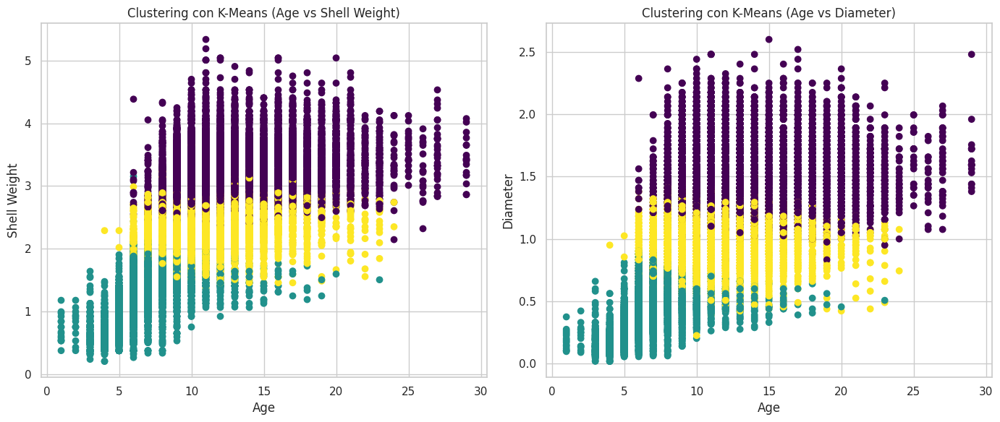

In [ ]:
# Aplicamos K-Means con 3
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(scaled_features)
labels = kmeans.labels_

# Creamos una figura con dos subplots
plt.figure(figsize=(14, 6))

# Primer gráfico: Age vs Shell weight
plt.subplot(1, 2, 1)
plt.scatter(df_crabs['Age'].apply(lambda x: math.exp(x)), df_crabs['Shell Weight'], c=labels, cmap='viridis')
plt.xlabel('Age')
plt.ylabel('Shell Weight')
plt.title('Clustering con K-Means (Age vs Shell Weight)')

# Segundo gráfico: Age vs Diameter
plt.subplot(1, 2, 2)
plt.scatter(df_crabs['Age'].apply(lambda x: math.exp(x)), df_crabs['Diameter'], c=labels, cmap='viridis')
plt.xlabel('Age')
plt.ylabel('Diameter')
plt.title('Clustering con K-Means (Age vs Diameter)')

plt.tight_layout()

plt.show()

In [ ]:
# Aplicar K-Means para obtener los centroides
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(df_crabs)
centroids = kmeans.cluster_centers_

# Creamos un seguimiento de datos para los puntos de datos
data_trace = go.Scatter3d(
    x=df_crabs["Age"].apply(lambda x: math.exp(x)),
    y=df_crabs["Shell Weight"],
    z=df_crabs["Diameter"],
    mode='markers',
    marker=dict(
        size=6,
        color=labels,  # Coloreamos los puntos basados en la etiqueta de grupo
        colorscale='Viridis',  # Definimos la paleta de colores
        opacity=0.8,
    ),
    name='Data Points'
)


# Creamos layout
layout = go.Layout(
    scene=dict(
        xaxis=dict(title='Age'),
        yaxis=dict(title='Shell weight'),
        zaxis=dict(title='Diameter')
    ),
    title='Interactive 3D Scatter Plot with Labels and Centroids'
)

# Creamos la figura object
fig = go.Figure(data=[data_trace], layout=layout)

# Mostramos el plot
fig.show()

In [ ]:
df_crabs["Cluster"] = labels
# determinamos la información de los 3 clusters creados con K-Means
df_crabs.groupby(['Cluster']).mean()
df_crabs.drop(columns = "Cluster", inplace = True)

Siendo la palabra tamaño la agrupación de todas las variables numéricas a excepción de edad...:
* Cluster 0: tamaño pequeño, corta edad y mayormente intersexuales
* Cluster 1: tamaño medio, edad media (adultos y jóvenes adultos) y todos los géneros. Nos encontramos con la población media de cangrejos.
* Cluster 2: tamaño grande, grandes de dimensiones y peso alto. Género tanto masculino como femenino, sin casi intersexuales. Cangrejos adultos.

## PCA

Podemos observar como dividiendo los valors con 3 clústers se diferencian entre ellos. Sin embargo, los dos grupos centrales no acaban de diferenciarse entre ellos a simple vista en estos gráficos. Podemos aplicar PCA para reducir la dimensionalidad de los datos.

Para aplicar el PCA es necesario indicar el número de componentes principales a los que queremos reduicir nuestros datos. Una manera de determinar este número podría ser calculando la varianza explicada acumulativa por cada componente principal y, después, trazando un gráfico para visualizarla.

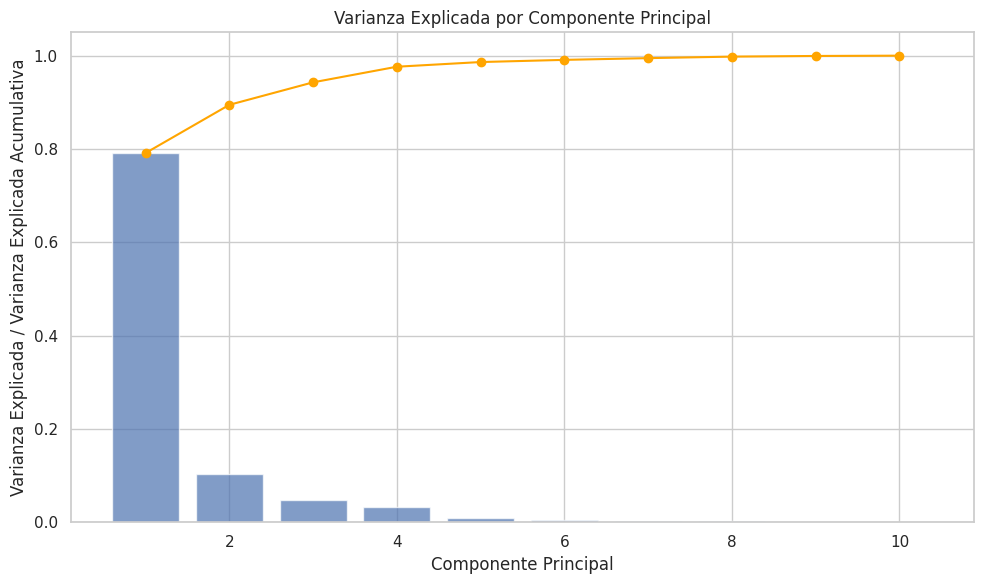

In [ ]:
# Aplicamos PCA a nuestros datos
pca = PCA()
X_pca = pca.fit_transform(scaled_features)

# Calculamos la varianza explicada por cada componente
explained_variance = pca.explained_variance_ratio_

# Calculamos la varianza explicada acumulativa
cumulative_explained_variance = np.cumsum(explained_variance)

# Creamos una figura de Matplotlib
plt.figure(figsize=(10, 6))

# Graficamos la varianza explicada por cada componente en un gráfico de barras
plt.bar(range(1, len(explained_variance) + 1), explained_variance, alpha=0.7, align='center')

# Graficamos la varianza explicada acumulativa en un gráfico de línea (color naranja)
plt.plot(range(1, len(cumulative_explained_variance) + 1), cumulative_explained_variance, color='orange', marker='o', linestyle='-')

# Configuración de etiquetas y título
plt.xlabel('Componente Principal')
plt.ylabel('Varianza Explicada / Varianza Explicada Acumulativa')
plt.title('Varianza Explicada por Componente Principal')
plt.grid(True)

# Mostramos la gráfica
plt.tight_layout()
plt.show()


Utilizando la varianza acumulada como criterio para determinar el número de componentes principales, vemos que el 95% de la varianza explicada acumulada se encuentra entre 1 y 2 componentes principales.

Esto sugiere que la mayoría de la variabilidad en tus datos puede ser representada en colo uno o dos componentes principales.

Sin embargo, se puede considerar las implicaciones de reducir la dimensionalidad, para ver si puede afetar la interpretación de los resultados.

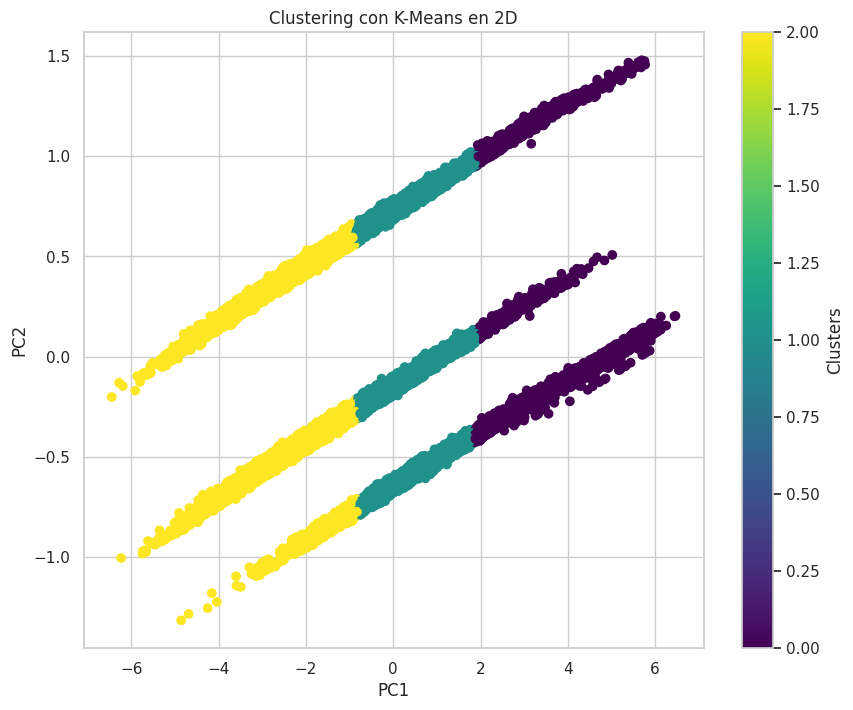

In [ ]:
# Reducimos la dimensionalidad con PCA a 2 componentes principales
pca = PCA(n_components=2)
X_pca = pca.fit_transform(scaled_features)

# Ejecutamos K-Means otra vez en los datos transformados por PCA
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(X_pca)
labels = kmeans.labels_

# Visualizamos los resultados del clustering en un gráfico bidimensional
plt.figure(figsize=(10, 8))

# Scatter plot 2D con los datos de PCA coloreados por los clusters
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='viridis')

# Etiquetas de los ejes
plt.xlabel('PC1')
plt.ylabel('PC2')

# Título del gráfico
plt.title('Clustering con K-Means en 2D')

# Leyenda
plt.colorbar(label='Clusters')

plt.show()

Hemos generado un gráfico bidimensional donde cada observación está determinado por los valores de sus dos primeros componentes principales.

La dispersión de los puntos nos refleja la variabilidad en los datos. Encontramos tres líneas muy marcadas. Vamos a observar que variables explica cada componente para dar una razón de estos tres grupos marcados (pese que el cluster no los haya agrupado en dichos grupos).

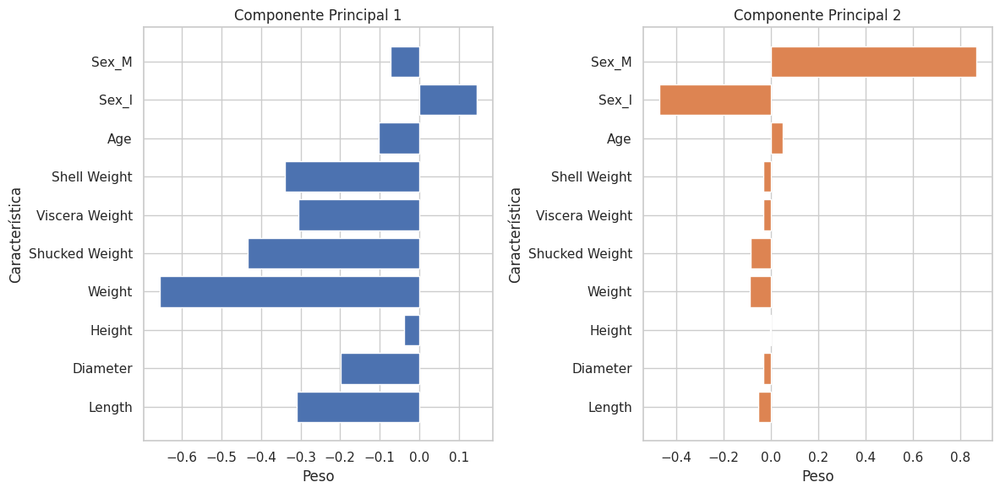

In [ ]:
# Obtener los pesos de las características en cada componente principal
feature_weights = pca.components_

# Crear un gráfico de barras para visualizar los pesos de las características en cada componente principal
num_features = len(feature_weights[0])
num_components = len(feature_weights)

plt.figure(figsize=(12, 6))

for i in range(num_components):
    plt.subplot(1, num_components, i+1)
    plt.barh(np.arange(num_features), feature_weights[i], color=f'C{i}')
    plt.xlabel('Peso')
    plt.ylabel('Característica')
    plt.title(f'Componente Principal {i+1}')
    plt.yticks(np.arange(num_features), df_crabs.columns)  # Etiquetar las características en el eje y


plt.tight_layout()
plt.show()

Con el peso mostrado de cada variable en cada componente principal observamos el porqué de los tres grupos.
* PC1: tiene el peso de todas las variables numéricas principalmente.

* PC2: tiene el peso de las variables categóricas que definen el sexo.

Recordemos que en los cangrejos existen tres tipos de sexo. PC2 deja mucha constancia de esos grupos en el 2dPCA plot.
Por ese motivo observamos que pese a esos grupos, k-means ha considerado otras variables para dividir en subgrupos.